# Import packages

In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>")) #Set scaling for the jupyter notebook cell width - make them bigger

In [2]:
#General packages
from IPython.display import clear_output #import of a single funtcion
import sys #system related packages
import os #better path and file handling
import pickle #saving and loading objects

#Tables, numbers etc
import pandas as pd #tables
import numpy as np #arrays
import scipy #sciency functions
from sklearn import mixture #For gaussian mixture model

#Plotting packages
import matplotlib.pyplot as plt #Main plotting
from matplotlib.ticker import MaxNLocator
from matplotlib.lines import Line2D
import seaborn as sbn #nicer plots

#RNA-seq analysis
import scanpy as sc #Main package for scRNA-seq analysis
import scanpy.external as sce #some more functions for scanpy
import bbknn #batch correction


root = '/mnt/c' if 'mnt' in os.getcwd() else 'C:' #root path depending on which environment I use

#Import some custom helper functions for plotting
path_skin_scripts = '{}/Users/karlan/Documents/Python/Projects'.format(root)
sys.path.append(path_skin_scripts)
from Skin_scripts import *
from Skin10X_imaging_scripts_v1_0 import *

In [3]:
#Print package versions for important packages (matplotlib and seaborn are excluded from this list)
sc.logging.print_header()

scanpy==1.7.2 anndata==0.7.6 umap==0.5.1 numpy==1.20.3 scipy==1.6.3 pandas==1.2.4 scikit-learn==0.24.2 statsmodels==0.12.2 python-igraph==0.9.1


In [4]:
#Import cell cycle related gene set
cell_cycle_genes_path = '{}/Documents and Settings/karlan/Documents/Files_for_Ubuntu/regev_lab_cell_cycle_genes.txt'.format(root)

cell_cycle_genes = [x.strip().title() for x in open(cell_cycle_genes_path)]

# Separate dataset for S-phase or G2M-phase associated genes
s_genes = [x for x in cell_cycle_genes[:43]]
g2m_genes = [x for x in cell_cycle_genes[43:]]

# Read in data

In [5]:
path = '{}/Users/karlan/Google Drive/MKA/Papers/Greco/Sara and Nur/Loom files'.format(root)
filename = 'WTMU_validation.loom'

In [6]:
adata = sc.read_loom(os.path.join(path, filename), spec_version = 'old', validate = False)
adata.obs['seurat_clusters'] = adata.obs['seurat_clusters'].astype(str) #Set seurat cluster names as string

In [7]:
adata

AnnData object with n_obs × n_vars = 30188 × 18881
    obs: 'Immune21', 'Infundibulum1', 'RBC1', 'RNA_snn_res.0.1', 'integrated_snn_res.0.1', 'nCount_RNA', 'nFeature_RNA', 'orig.ident', 'percent.mt', 'seurat_clusters', 'tdt_info'
    layers: 'counts'

# Preprocessing

## QC metrics

In [8]:
adata.var['ribo'] = adata.var_names.str.startswith('Rps') | adata.var_names.str.startswith('Rpl')
adata.var['mito'] = adata.var_names.str.startswith('mt')
adata.var['hemo'] = adata.var_names.str.startswith('Hba') | adata.var_names.str.startswith('Hbb')

In [9]:
adata

AnnData object with n_obs × n_vars = 30188 × 18881
    obs: 'Immune21', 'Infundibulum1', 'RBC1', 'RNA_snn_res.0.1', 'integrated_snn_res.0.1', 'nCount_RNA', 'nFeature_RNA', 'orig.ident', 'percent.mt', 'seurat_clusters', 'tdt_info'
    var: 'ribo', 'mito', 'hemo'
    layers: 'counts'

In [10]:
sc.pp.calculate_qc_metrics(adata, inplace = True, qc_vars = ['ribo','mito','hemo'])

... storing 'orig.ident' as categorical
... storing 'seurat_clusters' as categorical


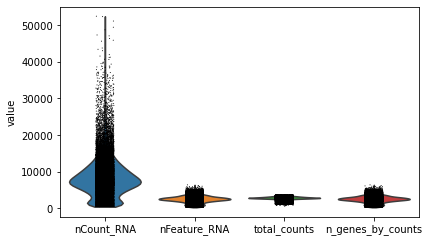

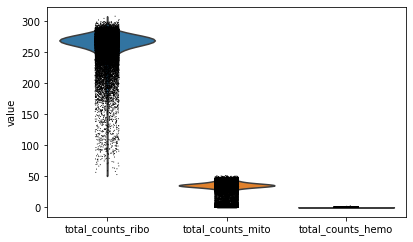

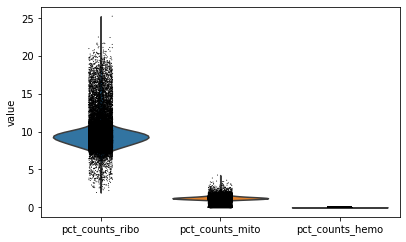

In [11]:
#Plot results of QC metrics
sc.pl.violin(adata, keys = ['nCount_RNA','nFeature_RNA', 'total_counts', 'n_genes_by_counts'])
sc.pl.violin(adata, keys = ['total_counts_ribo','total_counts_mito', 'total_counts_hemo'])
sc.pl.violin(adata, keys = ['pct_counts_ribo','pct_counts_mito', 'pct_counts_hemo'])

## Filter out lowly epxressed genes

In [12]:
#Save raw (log-normalized) expression matrix before gene filtering
adata.raw = adata

In [13]:
sc.pp.filter_genes(adata, min_cells=5)
sc.pp.filter_genes(adata, min_counts=10)

## Highly variable genes

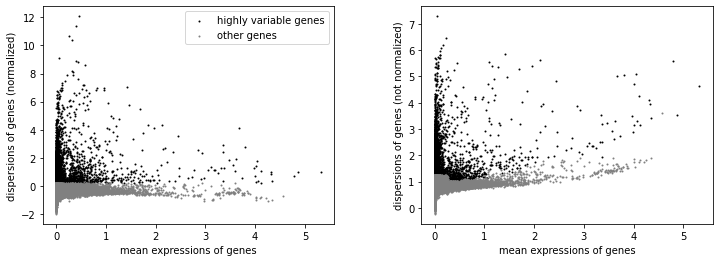

In [14]:
sc.pp.highly_variable_genes(adata, n_top_genes = 4000)
sc.pl.highly_variable_genes(adata)

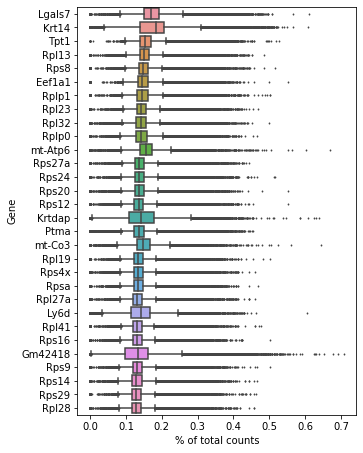

In [15]:
#Plot highest expressed genes
sc.pl.highest_expr_genes(adata)

## Annotate cell cycle phase

In [16]:
sc.pp.scale(adata) #Scale data to unit variance and zero mean
sc.tl.score_genes_cell_cycle(adata, s_genes = s_genes, g2m_genes = g2m_genes) #Annotate cell-cycle phase

# Initial dimensionality reduction and cell identification

In [17]:
sc.pp.pca(adata)
#sc.pp.neighbors(adata)
bbknn.bbknn(adata, batch_key='orig.ident') #bbknn replaces sc.pp.neighbors - works nicely for batch correction
sc.tl.umap(adata)

In [18]:
#Cluster using Leiden algorithm with low resolution
#for identifying the main cell populations
sc.tl.leiden(adata, resolution = 0.3)

... storing 'phase' as categorical


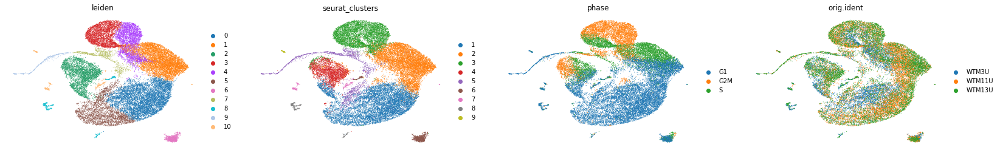

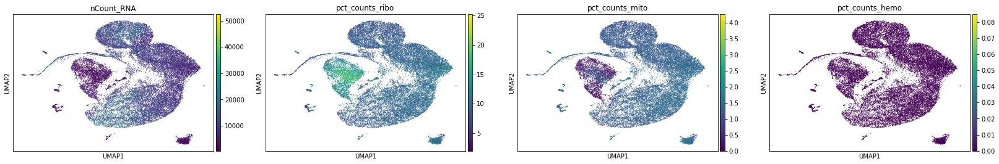

In [19]:
#Plot the resulting umap annotated according to the specified "colors"
sc.pl.umap(adata, color = ['leiden', 'seurat_clusters', 'phase', 'orig.ident'], frameon = False)
sc.pl.umap(adata, color = ['nCount_RNA', 'pct_counts_ribo','pct_counts_mito', 'pct_counts_hemo'])

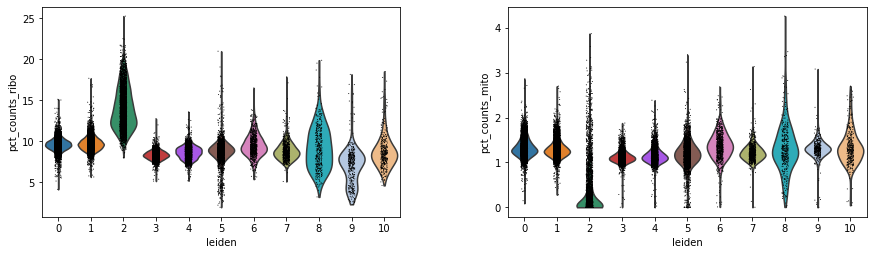

In [20]:
#Violinplots for ribosomal and mitochondrial gene counts according to leiden clustering
#to confirm the "weird" cell population
sc.pl.violin(adata, keys = ['pct_counts_ribo', 'pct_counts_mito'], groupby='leiden')

Check how many "weird" cells there are

In [21]:
cluster = '2'
print('{} weird cells / {} total cells = {:.1f}%'.format(sum(adata.obs['leiden']==cluster), 
                                                         sum(adata.obs['leiden']!=cluster), 
                                                         (sum(adata.obs['leiden']==cluster)/sum(adata.obs['leiden']!=cluster)*100)))

3683 weird cells / 26505 total cells = 13.9%


## Identify IFE cells

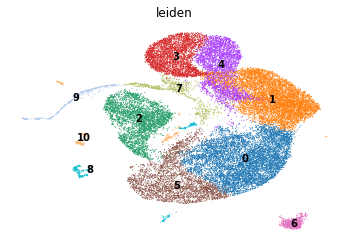

In [22]:
sc.pl.umap(adata, color = ['leiden'], legend_loc='on data', frameon = False)

ax = axes[ix // ncols, ix % ncols]


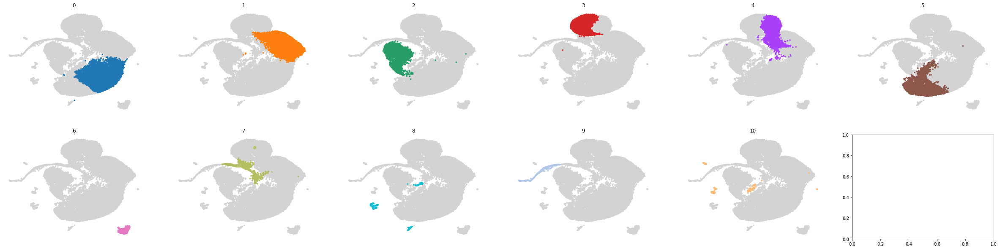

In [23]:
groups = adata.obs['leiden'].unique() #Get unique cluster names
ncols = 6 #specify number of columns for the plotting grid
fig, axes = initialize_subplots(len(groups), ncols = ncols) #custom convenience function to make it easier to for plotting in a grid

for ix, g in enumerate(sorted(groups, key = lambda x: int(x))): #"lambda x: int(x)" is a shorthand function to sort groups according to their numbers (normally stored as strings)
    ax = get_ax(axes, ix, ncols) #another convenience function to specify where to plot on the grid
    sc.pl.umap(adata, color = 'leiden', ax = ax, show = False, frameon = False, groups = [g], legend_loc = 'on_data', title = g, s = 50) #plot each cluster separately to see where the cells are

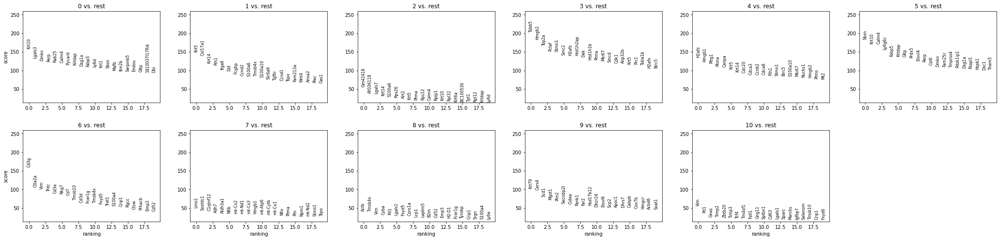

,0,1,2,3,4,5,6,7,8,9,10
0,Krt10,Krt5,Gm42418,Tubb5,H2afz,Sbsn,Cd3g,Lmo1,Actb,Krt79,Vim
1,Lgals3,Col17a1,AY036118,Hmgb2,Hmgb1,Krt10,Ctla2a,Sostdc1,Tmsb4x,Cers4,Ftl1
2,Dmkn,Krt14,Lgals7,Top2a,Pttg1,Calm4,Vim,C1qtnf12,Vim,Scd1,Gnas
3,Perp,Fth1,Krt14,Pclaf,Ptma,Ly6g6c,Trdc,Adh7,Cyba,Mgst1,Timp2
4,Rab25,Itga6,S100a6,Stmn1,Cenpa,Fabp5,Cd3e,Aldh3a1,Ftl1,Plin2,Zbtb20
5,Calm4,Dst,Rps26,Smc2,Krt5,Krtdap,Nkg7,Nfib,Lgals1,Secisbp2l,Timp3
6,Pycard,Fcgbp,Krt2,H2afz,Krt14,Gltp,Cd7,mt-Co2,Fxyd5,Cidea,Tcf4
7,Krtdap,Ccnd2,Krt5,Hist1h2ap,Cdc20,Prdx5,Tmsb10,mt-Nd1,Coro1a,Pank1,Tm4sf1
8,Dsg1a,S100a6,Ptma,Dek,Cdca3,Elovl4,Cd3d,mt-Co3,Lcp1,Far2,Fstl1
9,Fabp5,Tmsb4x,Rps12,Hist1h1b,Ccnb2,Perp,Fcer1g,Hmgb1,Laptm5,Hsd17b12,Gng11


In [24]:
#DGE test based on leiden clustering
sc.tl.rank_genes_groups(adata, groupby = 'leiden')
sc.pl.rank_genes_groups(adata, ncols = 6) #Plot results showing the score (combination of log-foldchange and adjusted p-value) for top genes
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(20) #Put the top genes in a table for easier reading

In [25]:
#Define IFE clusters
groups = ['0','1','3','4','5']

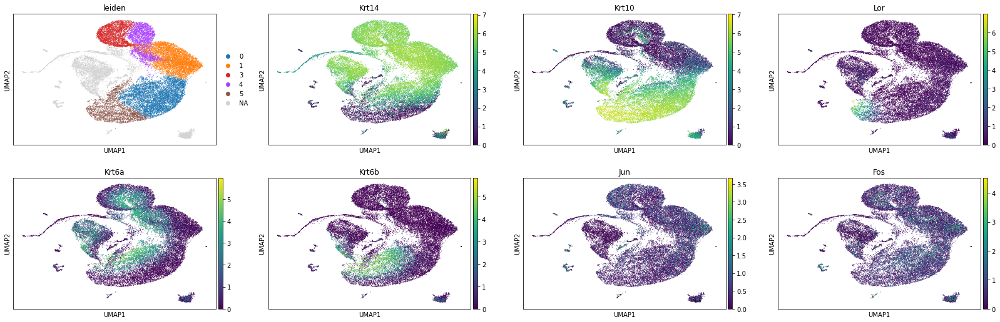

In [26]:
#Some quick plots to double check the selected clusters
sc.pl.umap(adata, color = ['leiden', 'Krt14','Krt10','Lor', 'Krt6a','Krt6b','Jun','Fos'], groups = groups, ncols = 4)

In [27]:
#Actually do the filtering for IFE cells
adata = adata[adata.obs['leiden'].isin(groups)].copy()

In [28]:
adata

AnnData object with n_obs × n_vars = 23840 × 16197
    obs: 'Immune21', 'Infundibulum1', 'RBC1', 'RNA_snn_res.0.1', 'integrated_snn_res.0.1', 'nCount_RNA', 'nFeature_RNA', 'orig.ident', 'percent.mt', 'seurat_clusters', 'tdt_info', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'total_counts_hemo', 'log1p_total_counts_hemo', 'pct_counts_hemo', 'S_score', 'G2M_score', 'phase', 'leiden'
    var: 'ribo', 'mito', 'hemo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'n_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_co

In [30]:
#Save cell names of IFE cells in a variable
WTMU_IFE_cells = adata.obs_names

Store the saved IFE cell names in Jupyter

In [31]:
%store WTMU_IFE_cells

Stored 'WTMU_IFE_cells' (Index)


# Filter out confounding cells (immune, sebaceous gland, stressed, K6 if not wound)

## Reload raw data for IFE cells

Retrieve the stored variables

In [5]:
%store -r

In [7]:
path = '{}/Users/karlan/Google Drive/MKA/Papers/Greco/Sara and Nur/Loom files'.format(root)
filename = filename = 'WTMU_integrated_filtered.loom'

In [8]:
adata = sc.read_loom(os.path.join(path, filename), spec_version = 'old', validate = False)[WTMU_IFE_cells] #Read in the raw loom file and immediately filter only for the selected cells
adata.obs['seurat_clusters'] = adata.obs['seurat_clusters'].astype(str)

Trying to set attribute `.obs` of view, copying.


## Rerun initial preprocessing steps on only IFE cells

In [9]:
adata.var['ribo'] = adata.var_names.str.startswith('Rps') | adata.var_names.str.startswith('Rpl')
adata.var['mito'] = adata.var_names.str.startswith('mt')
adata.var['hemo'] = adata.var_names.str.startswith('Hba') | adata.var_names.str.startswith('Hbb')

In [10]:
sc.pp.calculate_qc_metrics(adata, inplace = True, qc_vars = ['ribo','mito','hemo'])

In [11]:
adata

AnnData object with n_obs × n_vars = 23840 × 18881
    obs: 'Immune21', 'Infundibulum1', 'RBC1', 'RNA_snn_res.0.1', 'integrated_snn_res.0.1', 'nCount_RNA', 'nFeature_RNA', 'orig.ident', 'percent.mt', 'seurat_clusters', 'tdt_info', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'total_counts_hemo', 'log1p_total_counts_hemo', 'pct_counts_hemo'
    var: 'ribo', 'mito', 'hemo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    layers: 'counts'

... storing 'orig.ident' as categorical
... storing 'seurat_clusters' as categorical


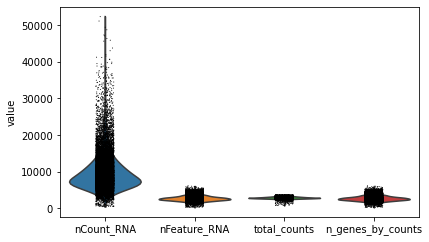

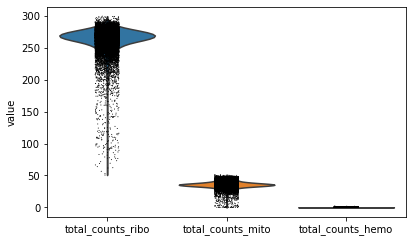

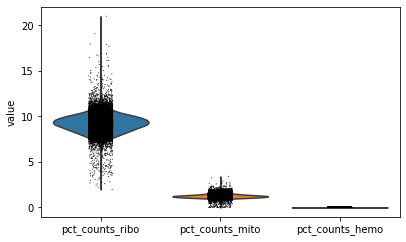

In [12]:
sc.pl.violin(adata, keys = ['nCount_RNA','nFeature_RNA', 'total_counts', 'n_genes_by_counts'])
sc.pl.violin(adata, keys = ['total_counts_ribo','total_counts_mito', 'total_counts_hemo'])
sc.pl.violin(adata, keys = ['pct_counts_ribo','pct_counts_mito', 'pct_counts_hemo'])

In [13]:
adata.raw = adata

In [14]:
sc.pp.filter_genes(adata, min_cells=5)
sc.pp.filter_genes(adata, min_counts=10)

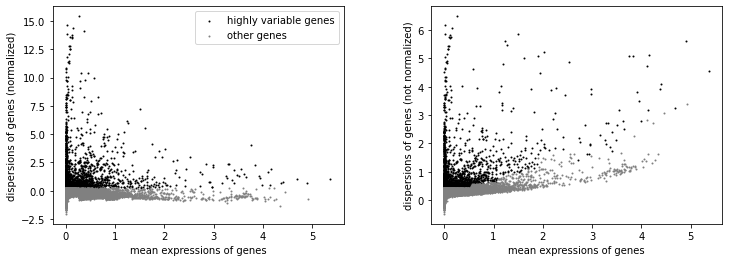

In [15]:
sc.pp.highly_variable_genes(adata, n_top_genes = 2000)
sc.pl.highly_variable_genes(adata)

In [16]:
sc.pp.scale(adata)
sc.tl.score_genes_cell_cycle(adata, s_genes = s_genes, g2m_genes = g2m_genes)

## Dimensionality reduction

In [17]:
sc.pp.pca(adata)
#sc.pp.neighbors(adata)
bbknn.bbknn(adata, batch_key = 'orig.ident')
sc.tl.umap(adata)

In [18]:
sc.tl.leiden(adata, resolution = 0.3)

... storing 'phase' as categorical


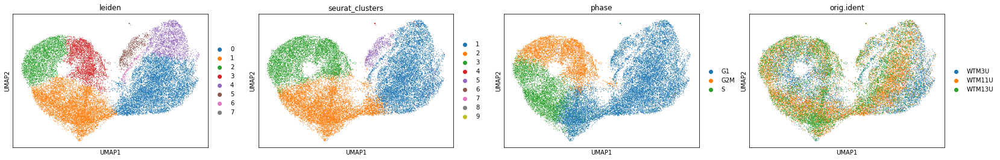

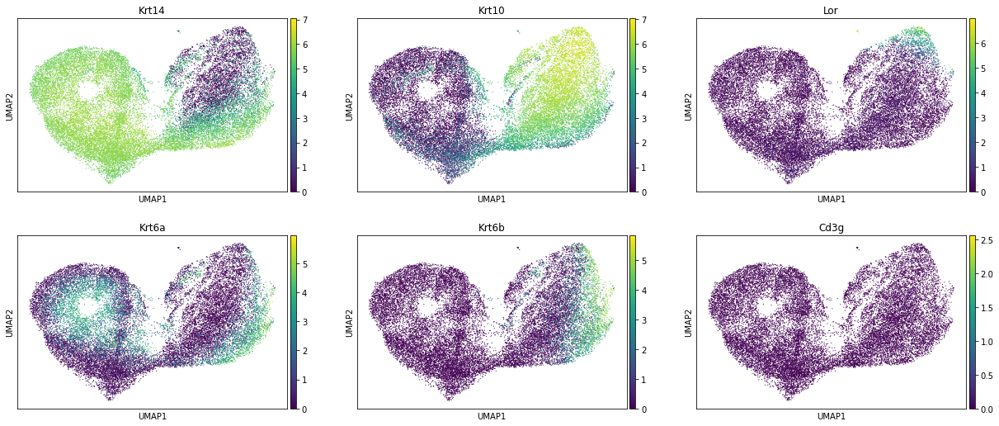

In [19]:
sc.pl.umap(adata, color = ['leiden', 'seurat_clusters', 'phase', 'orig.ident'])
sc.pl.umap(adata, color = ['Krt14','Krt10','Lor','Krt6a','Krt6b','Cd3g'], ncols = 3)

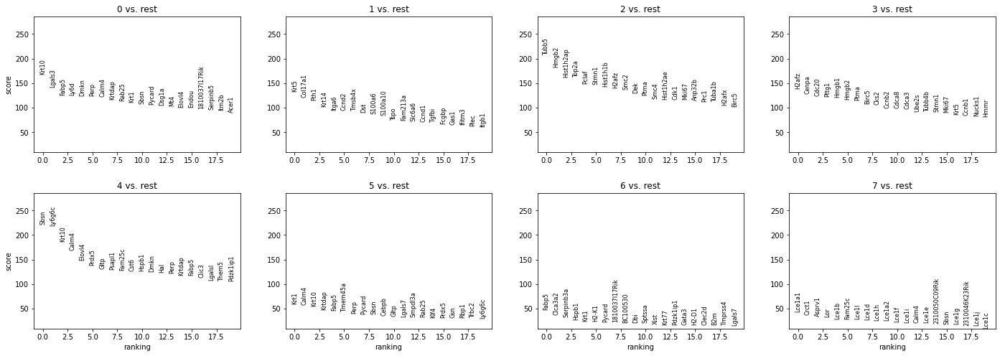

,0,1,2,3,4,5,6,7
0,Krt10,Krt5,Tubb5,H2afz,Sbsn,Krt1,Fabp5,Lce1a1
1,Lgals3,Col17a1,Hmgb2,Cenpa,Ly6g6c,Calm4,Clca3a2,Crct1
2,Fabp5,Fth1,Hist1h2ap,Cdc20,Krt10,Krt10,Serpinb3a,Asprv1
3,Ly6d,Krt14,Top2a,Pttg1,Calm4,Krtdap,Hspb1,Lor
4,Dmkn,Itga6,Pclaf,Hmgb1,Elovl4,Fabp5,Krt1,Lce1b
5,Perp,Ccnd2,Stmn1,Hmgb2,Prdx5,Tmem45a,H2-K1,Fam25c
6,Calm4,Tmsb4x,Hist1h1b,Ptma,Gltp,Perp,Pycard,Lce1l
7,Krtdap,Dst,H2afz,Birc5,Psapl1,Pycard,1810037I17Rik,Lce1d
8,Rab25,S100a6,Smc2,Cks2,Fam25c,Sbsn,BC100530,Lce1h
9,Krt1,S100a10,Dek,Ccnb2,Cst6,Cebpb,Dbi,Lce1a2


In [20]:
#Check marker genes for the clusters
sc.tl.rank_genes_groups(adata, groupby = 'leiden')
sc.pl.rank_genes_groups(adata)
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(20)

### Check for infundibulum and sebaceous gland gene expression

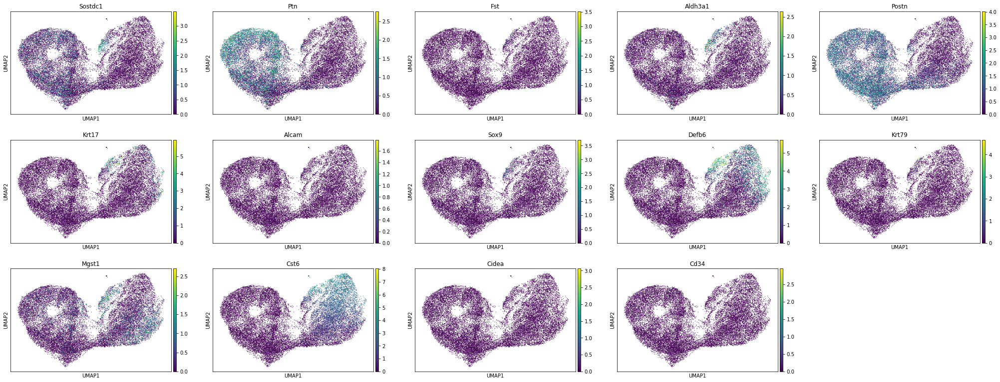

In [21]:
infu = ['Sostdc1','Ptn','Fst','Aldh3a1','Postn','Krt17','Alcam','Sox9','Defb6','Krt79','Mgst1','Cst6', 'Cidea', 'Cd34']
sc.pl.umap(adata, color = infu, ncols = 5, use_raw = True)

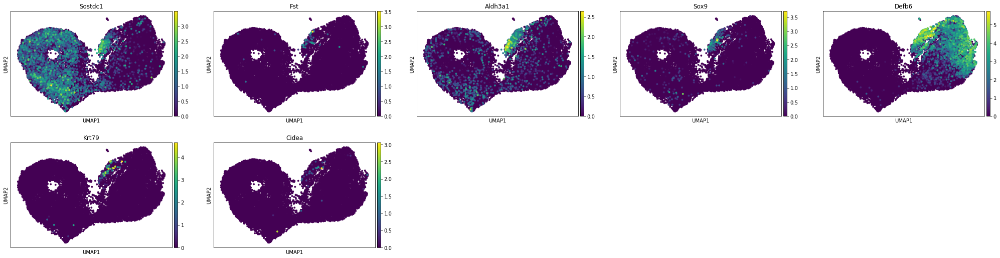

In [22]:
infu = ['Sostdc1','Fst','Aldh3a1','Sox9','Defb6','Krt79', 'Cidea']
sc.pl.umap(adata, color = infu, ncols = 5, use_raw = True, s = 60)

## Identify cells to be filtered out

### Stress score

/home/karl/anaconda3/envs/scanpy/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='stress_score', ylabel='Density'>

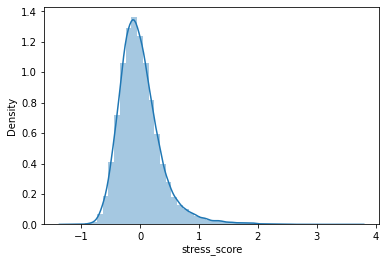

In [23]:
genes = ['Fosb', 'Fos', 'Jun', 'Junb', 'Jund', 'Atf3', 'Egr1', 'Hspa1a', 'Hspa1b', 'Hsp90ab1', 'Hspa8', 'Hspb1', 'Ier3', 'Ier2', 'Btg1', 'Btg2', 'Dusp1']
sc.tl.score_genes(adata, gene_list = genes, score_name = 'stress_score', use_raw = False)
sbn.distplot(adata.obs['stress_score'])

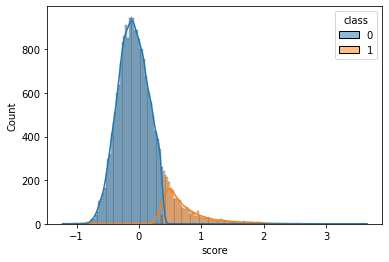

In [24]:
#Use a gaussian mixture model to classify the cells according to a single score
x = adata.obs['stress_score'].values.reshape(-1,1)
components = 2 #more components can lead to a more fine-grained identification, if needed

gmm = mixture.GaussianMixture(n_components=components, covariance_type='diag', n_init = 10).fit(x) #Initialize the classifier

tmp = pd.DataFrame(x, columns = ['score'], index = adata.obs_names) #Make a temporary table to store the scores and classification in
tmp['class'] = gmm.predict(x) #Add classification results to the table
sort = {x: ix for ix, (x, s) in enumerate(tmp.groupby('class')['score'].mean().sort_values().items())} #Sort the results so that class 0 is always the lowest score
tmp['class'] = [sort[x] for x in tmp['class']] #Actually do the sorting in the table

sbn.histplot(tmp, x = 'score', hue = 'class', palette = 'tab10', kde = True) #Plot the results

adata.obs['Stress'] = np.where(tmp.loc[adata.obs_names, 'class']==1, 'Stressed', 'Healthy') #Annotate cells based on the classification

### Immune score

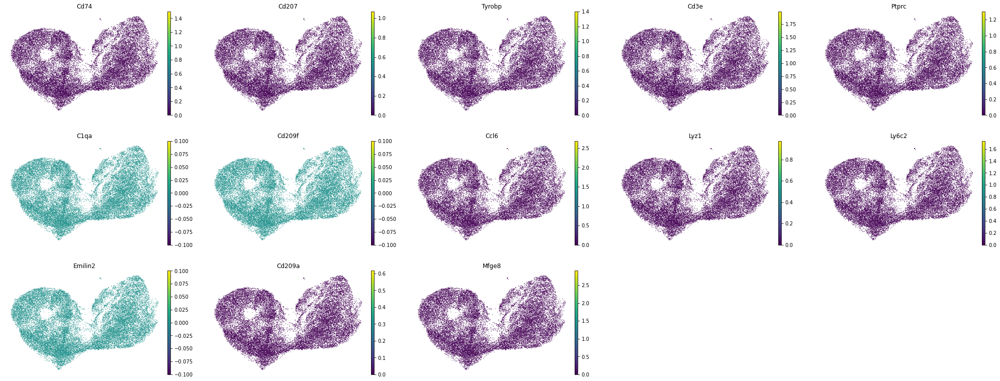

In [35]:
imm_genes = ['Cd74','Cd207','Tyrobp','Cd3e','Ptprc','C1qa','Cd209f','Ccl6','Lyz1','Ly6c2','Emilin2','Cd209a','Mfge8']
sc.pl.umap(adata, color = imm_genes, frameon = False, ncols = 5)

/home/karl/anaconda3/envs/scanpy/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='imm_score', ylabel='Density'>

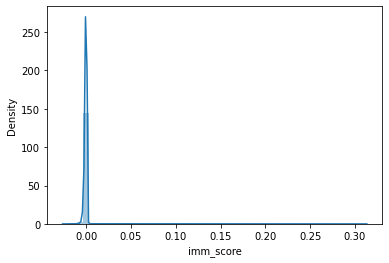

In [36]:
sc.tl.score_genes(adata, gene_list = imm_genes, score_name = 'imm_score', use_raw = True)
sbn.distplot(adata.obs['imm_score'])

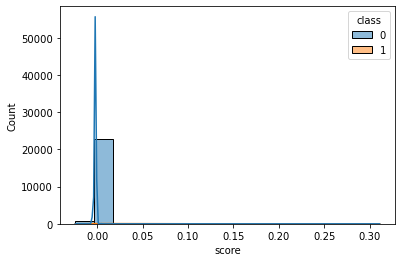

In [37]:
x = adata.obs['imm_score'].values.reshape(-1,1)
components = 2
gmm = mixture.GaussianMixture(n_components=components, covariance_type='full', n_init = 10).fit(x)
tmp = pd.DataFrame(x, columns = ['score'], index = adata.obs_names)
tmp['class'] = gmm.predict(x)
sort = {x: ix for ix, (x, s) in enumerate(tmp.groupby('class')['score'].mean().sort_values().items())}
tmp['class'] = [sort[x] for x in tmp['class']]

sbn.histplot(tmp, x = 'score', hue = 'class', palette = 'tab10', kde = True)

adata.obs['Immune'] = np.where(tmp.loc[adata.obs_names, 'class']==1, 'Immune', 'Non-immune')

### Infundibulum/SG

/home/karl/anaconda3/envs/scanpy/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='infu_score', ylabel='Density'>

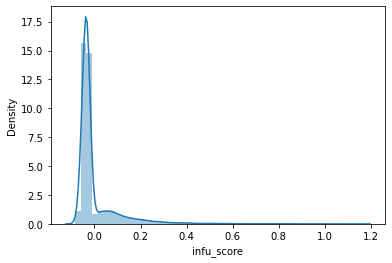

In [30]:
infu_genes = ['Sostdc1','Fst','Aldh3a1','Sox9','Krt79', 'Cidea']
sc.tl.score_genes(adata, gene_list = infu_genes, score_name = 'infu_score', use_raw = True)
sbn.distplot(adata.obs['infu_score'])

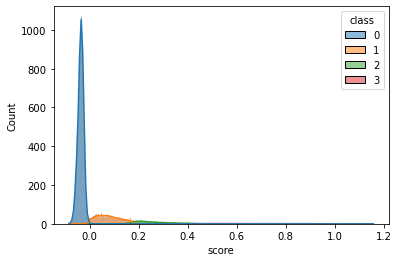

In [31]:
x = adata.obs['infu_score'].values.reshape(-1,1)
components = 4
gmm = mixture.GaussianMixture(n_components=components, covariance_type='full', n_init = 10).fit(x)
tmp = pd.DataFrame(x, columns = ['score'], index = adata.obs_names)
tmp['class'] = gmm.predict(x)
sort = {x: ix for ix, (x, s) in enumerate(tmp.groupby('class')['score'].mean().sort_values().items())}
tmp['class'] = [sort[x] for x in tmp['class']]

sbn.histplot(tmp, x = 'score', hue = 'class', palette = 'tab10', kde = True)

adata.obs['Infu'] = np.where(tmp.loc[adata.obs_names, 'class']>1, 'Infu', 'IFE')

### Plot results

... storing 'Immune' as categorical


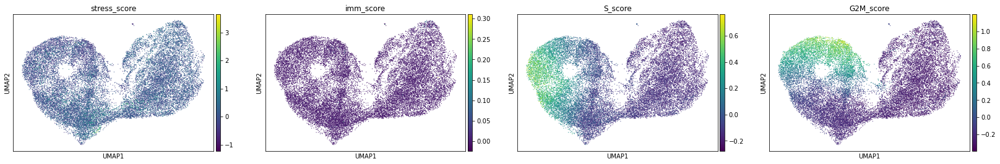

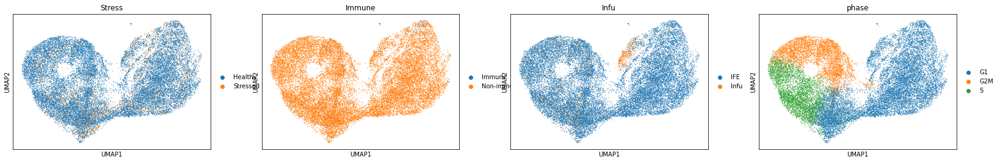

In [38]:
sc.pl.umap(adata, color = ['stress_score', 'imm_score', 'S_score', 'G2M_score'])
sc.pl.umap(adata, color = ['Stress', 'Immune', 'Infu', 'phase'])

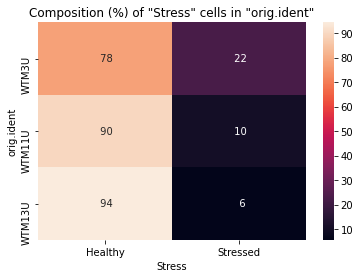

In [41]:
#Does any of the batches have more stressed cells in it?
plot_group_composition_heatmap(adata.obs, groupby_name='orig.ident', count_group_name='Stress')

### Wound cells (Krt6a, Krt6b, Krt16

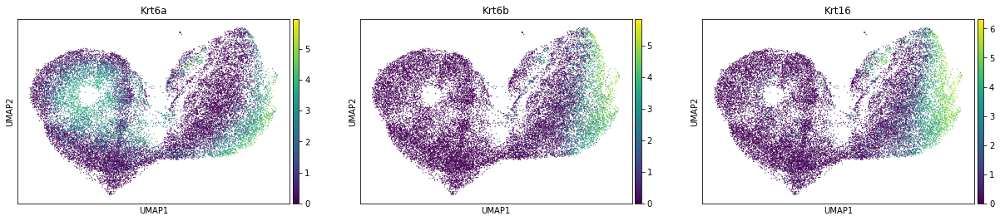

In [47]:
wound_genes = ['Krt6a','Krt6b', 'Krt16']
sc.pl.umap(adata, color = wound_genes)

/home/karl/anaconda3/envs/scanpy/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='wound_score', ylabel='Density'>

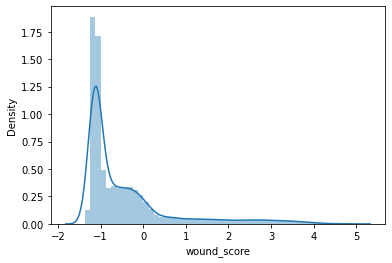

In [49]:
sc.tl.score_genes(adata, gene_list = wound_genes, score_name = 'wound_score', use_raw = True)
sbn.distplot(adata.obs['wound_score'])

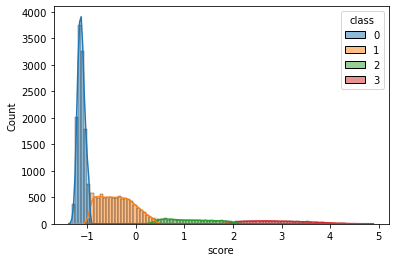

In [55]:
x = adata.obs['wound_score'].values.reshape(-1,1)
components = 4
gmm = mixture.GaussianMixture(n_components=components, covariance_type='full', n_init = 10).fit(x)
tmp = pd.DataFrame(x, columns = ['score'], index = adata.obs_names)
tmp['class'] = gmm.predict(x)
sort = {x: ix for ix, (x, s) in enumerate(tmp.groupby('class')['score'].mean().sort_values().items())}
tmp['class'] = [sort[x] for x in tmp['class']]

sbn.histplot(tmp, x = 'score', hue = 'class', palette = 'tab10', kde = True)

adata.obs['Wound'] = np.where(tmp.loc[adata.obs_names, 'class']>1, 'Wound', 'Healthy')

... storing 'Wound' as categorical


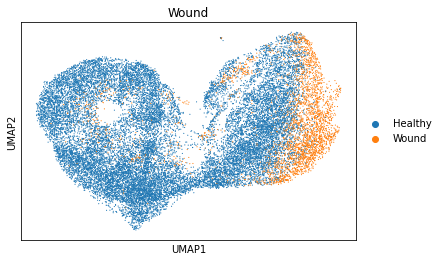

In [56]:
sc.pl.umap(adata, color = 'Wound')

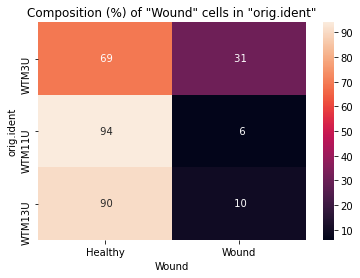

In [57]:
#Does any of the batches have more stressed cells in it?
plot_group_composition_heatmap(adata.obs, groupby_name='orig.ident', count_group_name='Wound')

### Filter cells

In [58]:
adata = adata[(adata.obs['Immune']!='Immune') & (adata.obs['Infu']!='Infu') & (adata.obs['Wound']!='Wound') & (adata.obs['Stress']!='Stressed')].copy() #Remove immune, infundibulum, stressed and wound cells.

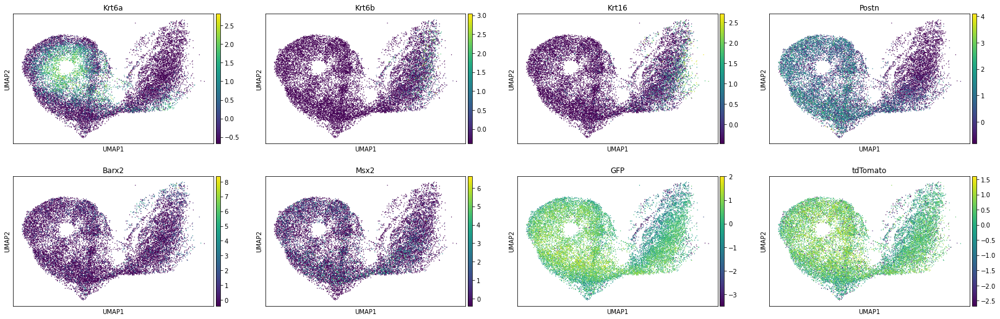

In [67]:
#plot remaining cells
sc.pl.umap(adata, color = ['Krt6a','Krt6b','Krt16','Postn', 'Barx2', 'Msx2', 'GFP','tdTomato'], use_raw = False, ncols = 4)

In [59]:
WTMU_IFE_cells_filtered = adata.obs_names #Get cell names of remaining IFE cells and store them

In [68]:
#Save annotations
WTMU_IFE_cells_filtered_obs = adata.obs.copy()

In [60]:
%store WTMU_IFE_cells_filtered

Stored 'WTMU_IFE_cells_filtered' (Index)


In [69]:
%store WTMU_IFE_cells_filtered_obs

Stored 'WTMU_IFE_cells_filtered_obs' (DataFrame)


# Reload data for integration

In [5]:
%store -r

In [7]:
path = '{}/Users/karlan/Google Drive/MKA/Papers/Greco/Sara and Nur/Loom files'.format(root)
filename = 'WTMU_integrated_filtered.loom'

In [8]:
adata = sc.read_loom(os.path.join(path, filename), spec_version = 'old', validate = False)[WTMU_IFE_cells_filtered]
adata.obs = WTMU_IFE_cells_filtered_obs.loc[adata.obs_names].copy() #Include the annotations that were saved previously (make sure the index matches adata order)

In [9]:
adata.raw = adata

In [10]:
sc.pp.filter_genes(adata, min_cells=5)
sc.pp.filter_genes(adata, min_counts=10)

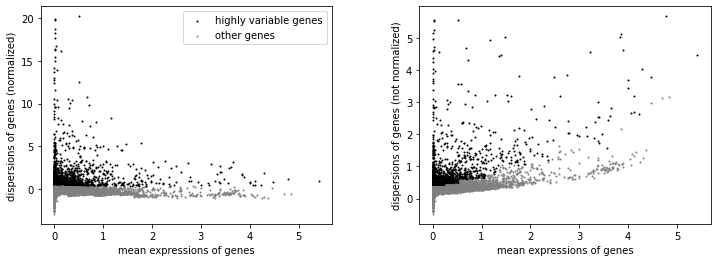

In [11]:
sc.pp.highly_variable_genes(adata, n_top_genes = 2000)
sc.pl.highly_variable_genes(adata)

In [12]:
sc.pp.scale(adata)

In [16]:
sc.pp.pca(adata)
#sc.pp.neighbors(adata)
bbknn.bbknn(adata, batch_key='orig.ident')
sc.tl.umap(adata)
sc.tl.leiden(adata, resolution = 0.3)

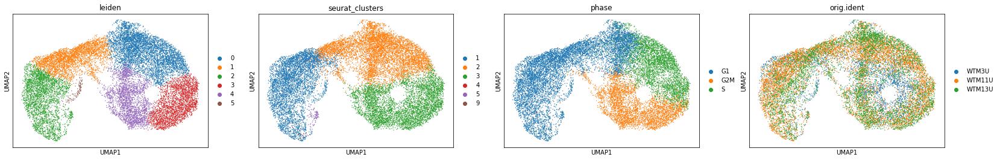

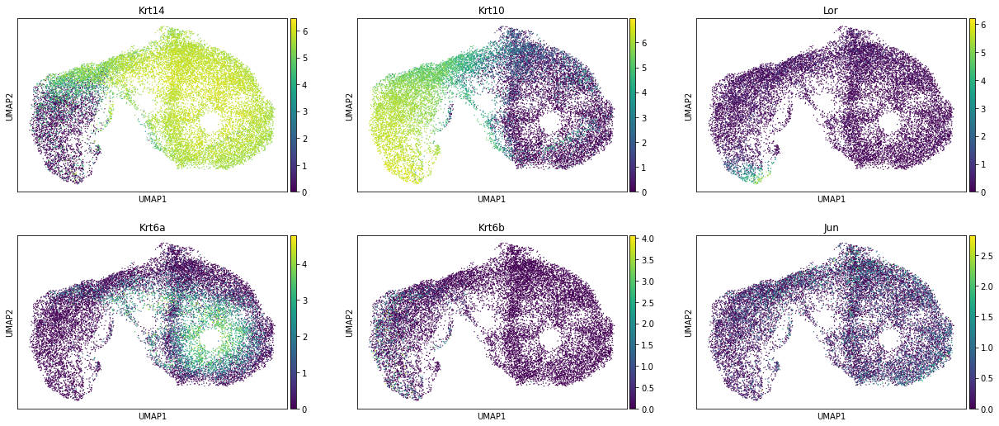

In [17]:
sc.pl.umap(adata, color = ['leiden', 'seurat_clusters', 'phase', 'orig.ident'])
sc.pl.umap(adata, color = ['Krt14','Krt10','Lor','Krt6a','Krt6b','Jun'], ncols = 3)

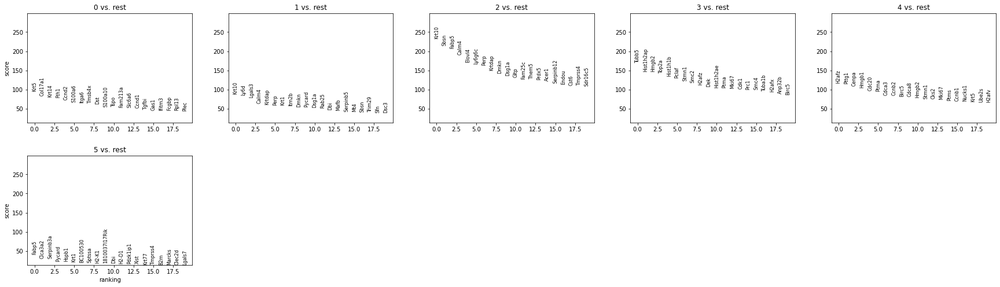

,0,1,2,3,4,5
0,Krt5,Krt10,Krt10,Tubb5,H2afz,Fabp5
1,Col17a1,Ly6d,Sbsn,Hist1h2ap,Pttg1,Clca3a2
2,Krt14,Lgals3,Fabp5,Hmgb2,Cenpa,Serpinb3a
3,Fth1,Calm4,Calm4,Top2a,Hmgb1,Pycard
4,Ccnd2,Krtdap,Elovl4,Hist1h1b,Cdc20,Hspb1
5,S100a6,Perp,Ly6g6c,Pclaf,Ptma,Krt1
6,Itga6,Krt1,Perp,Stmn1,Cdca3,BC100530
7,Tmsb4x,Itm2b,Krtdap,Smc2,Ccnb2,Sptssa
8,Dst,Dmkn,Dmkn,H2afz,Birc5,H2-K1
9,S100a10,Pycard,Dsg1a,Dek,Cdca8,1810037I17Rik


In [18]:
sc.tl.rank_genes_groups(adata, groupby = 'leiden')
sc.pl.rank_genes_groups(adata, ncols = 5)
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(20)

# Integrate with main dataset

## Load data used in Katie's paper

In [19]:
path = '{}/Users/karlan/Google Drive/MKA/Epidermal stem cells at the point of no return/Sequencing results/Combined_With_Joost_IFE/'.format(root)
filename = '20201008_ingest_combined_imputed_cc-regressed'
raw_filename_downsampled = '20200415_ingest_combined_imputed_cc-regressed_downscaled'

#data_magic object name comes from the imputation method that was used in the manuscript and the name persisted
data_magic = sc.read_loom(os.path.join(path, '{}.loom'.format(filename)), obs_names = 'obs_names', var_names = 'var_names')
data_magic.raw = sc.read_csv(os.path.join(path, '{}_raw_counts.csv'.format(raw_filename_downsampled))) #Read in raw data (needed to plot gene expression overlays)

#Read in unstructured annotations for data_magic that are not saved in the loom file.
#Integration needs to have the neighbourhood graph
with open(os.path.join(path, '{}_uns.pickle'.format(filename)), 'rb') as file:
    uns = pickle.load(file)
data_magic.uns = uns
for k in uns['neighbors'].keys(): #assign the neighbourhood graph to the correct position
    data_magic.uns['neighbors'][k] = uns['neighbors'][k]

data_magic.obs['binned_delamination'] = pd.Categorical(data_magic.obs['binned_delamination']) #Change the type of this column to be categorical

<ipython-input-19-e47894340eca>:15: FutureWarning: This location for 'distances' is deprecated. It has been moved to .obsp[distances], and will not be accesible here in a future version of anndata.
  data_magic.uns['neighbors'][k] = uns['neighbors'][k]
<ipython-input-19-e47894340eca>:15: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  data_magic.uns['neighbors'][k] = uns['neighbors'][k]


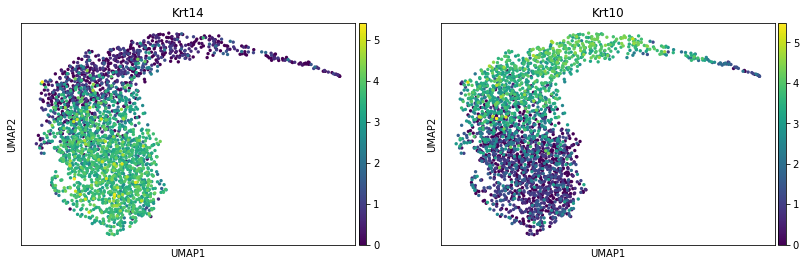

In [20]:
#Plot the loaded dataset
sc.pl.umap(data_magic)
clear_output() #This gets rid of notices that lots of adata.obs columns were automatically assigned a type - it's not important here
sc.pl.umap(data_magic, color = ['Krt14','Krt10'])

In [21]:
genes = data_magic.var_names.intersection(adata.var_names) #Get shared gene list between data_magic and adata objects
len(genes)

812

## Run integration

In [22]:
ingest_data = adata[:, genes].copy() #Make a temporary dataset for integration, keeping only the shared genes
ingest_data = sc.tl.ingest(ingest_data[:, genes], adata_ref = data_magic[:, genes], #Integrate to the reference dataset
                           obs = ['Location', 'binned_delamination', 'dpt_ordered', 'dpt_pseudotime'], inplace = False) #Additionally map the specified obsercations to the dataset

#'Location' represents either basal or suprabasal cells, depending on the location of sorted-basal cells used in the manuscript
#'Binned_delamination' represents ordered pseudotime that has been binned into 10 categories - leads to nicer violinplots
#'dpt_ordered' is the linear order of cells from 'dpt_pseudotime' annotations, where cell-cell distances can be wildly different

adata.obsm['X_umap_orig'] = adata.obsm['X_umap'].copy() #Save original dataset umap coordinates with a new name
adata.obsm['X_umap_ingest'] = ingest_data[adata.obs_names].obsm['X_umap'].copy() #Save the integrated umap coordinates to the main adata dataset
adata.obs = ingest_data[adata.obs_names].obs.copy() #Include the mapped annotations ('Location', 'binned_delamination', 'dpt_ordered', 'dpt_pseudotime')
del ingest_data #Delete the temporary object to save space

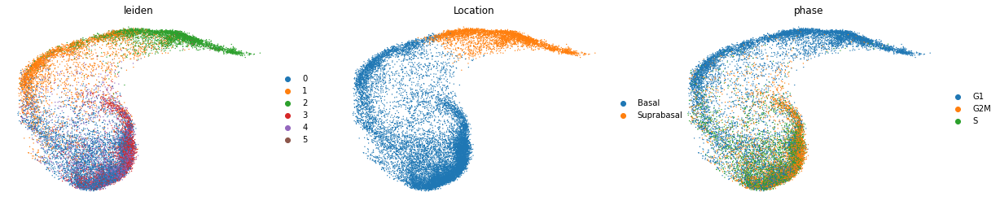

In [23]:
#Plot the results of integration and mapping onto the reference dataset
sc.pl.embedding(adata, basis = 'umap_ingest', color = ['leiden', 'Location', 'phase'], frameon = False)
#leiden and phase annotations are based on what was previously done for the current dataset, not integration

In [24]:
#Specify types
adata.obs['dpt_ordered'] = adata.obs['dpt_ordered'].astype(float)
adata.obs['dpt_pseudotime'] = adata.obs['dpt_pseudotime'].astype(float)

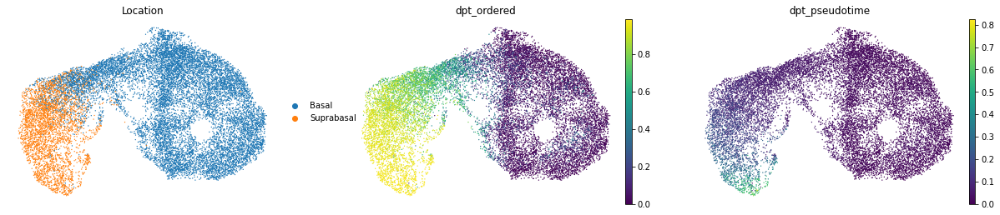

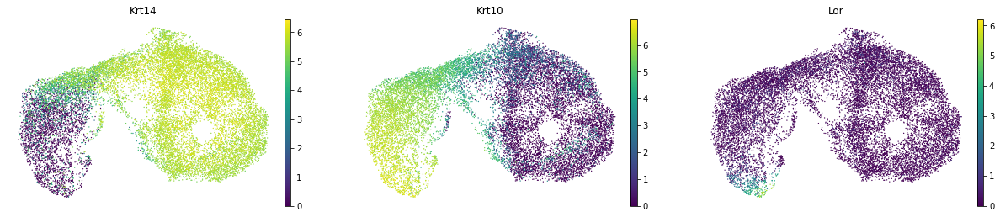

In [25]:
#Plot integration results on the original umap representation from before
sc.pl.embedding(adata, basis = 'umap_orig', color = ['Location','dpt_ordered','dpt_pseudotime'], frameon = False)
sc.pl.embedding(adata, basis = 'umap_orig', color = ['Krt14','Krt10','Lor'], frameon = False)

## Plot gene expression changes over pseudotime (binned)

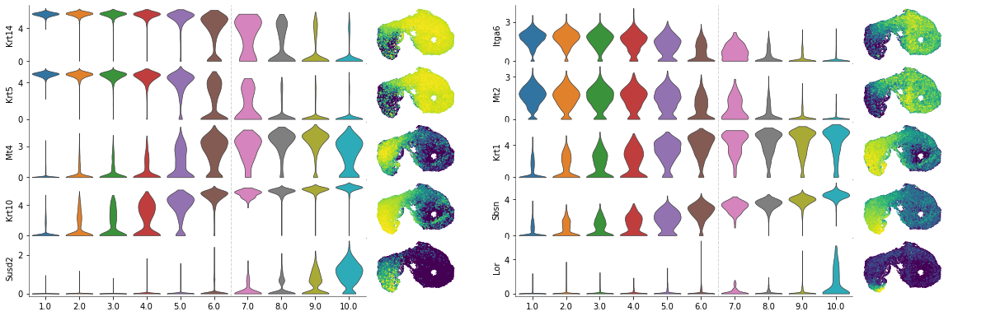

In [26]:
#Make nice looking violinplots + umaps

mpl.rcParams['axes.linewidth'] = 0.5
genes = ['Krt14', 'Itga6', 'Krt5', 'Mt2', 'Mt4', 'Krt1', 'Krt10', 'Sbsn', 'Susd2','Lor']

percentile = 99.9

cols = 2
ncols = 3*cols
fig, axes = initialize_subplots(groups_to_plot=len(genes)*3, ncols = ncols, figsize_multiplier=(3.5,1.3), 
                                gridspec_kw= {'hspace':0, 'wspace': 0.05, 'width_ratios': [4,1, 0.5]*cols})

plot = 0
for ix, gene in enumerate(genes):
    ax = get_ax(axes, plot, ncols)
    
    expr = adata.raw[:, gene].X.toarray().flatten()
    vmax = np.percentile(expr, q = percentile)
    
    #Violinplots
    sc.pl.violin(adata, keys = gene, groupby = 'binned_delamination', cut = 0, rotation = 0, ax = ax, show = False, stripplot = False, linewidth = 0.7, palette = 'tab10')
    
    ax.yaxis.set_major_locator(MaxNLocator(integer=True, nbins = 2))
    if ix < len(genes)-2:
        ax.tick_params(
        axis='x',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom=False,      # ticks along the bottom edge are off
        top=False,         # ticks along the top edge are off
        labelbottom=False)
        
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    

    ax.axvline(5.5, ls = '--', c = 'lightgrey', lw = 1)
    
    #Umaps
    plot+=1
    ax = get_ax(axes, plot, ncols)
    sc.pl.embedding(adata, basis = 'umap_orig', color = gene, ax = ax, show = False, frameon = False, title = '', s = 10, vmax = vmax)
    ax.set_ylim([ax.get_ylim()[0]-0.5, ax.get_ylim()[1]+0.5])
    # Remove umap colorbar
    ax.collections[-1].colorbar.remove()
    
    #Empty space for better separation
    plot+=1
    ax = get_ax(axes, plot, ncols)
    [ax.spines[spine].set_visible(False) for spine in ax.spines]
    ax.set_yticks([])
    ax.set_xticks([])
    plot+=1
    clear_output()
    
mpl.rcParams['axes.linewidth'] = 1

In [27]:
#Reorder pseudotime as the mapping resulted in cells sharing the same pseudotime value.
dpt_reordered = np.argsort(np.argsort(adata.obs['dpt_ordered']))
adata.obs['dpt_reordered'] = dpt_reordered/max(dpt_reordered)

(-6.545312720541527, 6.545312720541527)

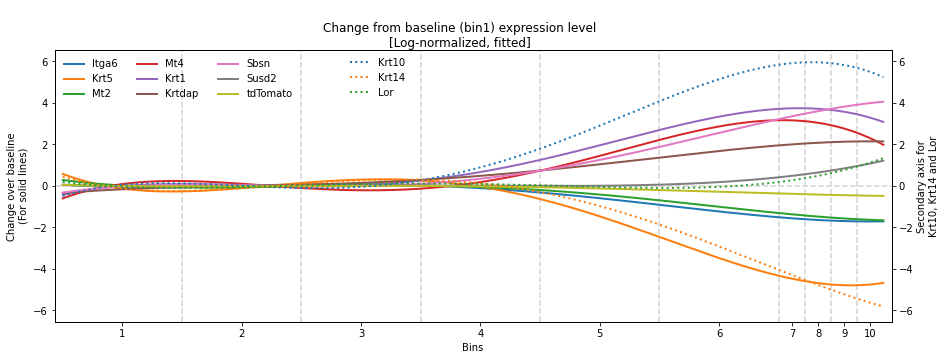

In [28]:
#Plot gene expression changes over pseudotime as compared to the mean expression in bin 1 (can also compare to other bins)

binning = 'binned_delamination'
dpt_group = 'dpt_reordered'

polyfit_deg = 4 #Degree for polynomial fit
chosen_bin = 1.0 #Which pin to compare the expression levels to

genes = ['Itga6', 'Krt5', 'Mt2', 'Mt4', 'Krt1', 'Krtdap','Sbsn', 'Susd2', 'tdTomato'] #Genes of interest to plot

rank = np.argsort(adata.obs[dpt_group])
dpt = adata[rank].obs[dpt_group].values

#Get bin borders from the reference dataset since they are better defined there
#Used only to draw the x-axis tick labels and vertical lines
bins = data_magic.obs.groupby(by = 'binned_delamination')['dpt_ordered'].min() 
bin_centers = []
for ix, b in enumerate(bins.values):
    if ix == 0:
        continue
    else:
        bin_centers.append((bins[ix-1]+b)/2)
bin_centers.append((1+bins[-1])/2) 

colors = sbn.color_palette(palette = 'tab10', n_colors = len(genes))

#Define plotting area
fig, ax = plt.subplots(figsize = (15, 5))
ax2 = ax.twinx() #Add a second y-axis

#Plot main genes
for ix, gene in enumerate(genes):
    expr = adata.raw[rank][:, gene].X.toarray().flatten()
    mean = expr[np.where(adata.obs[binning][rank]==chosen_bin)[0]].mean()
    p = np.poly1d(np.polyfit(dpt, expr, polyfit_deg))(dpt) #Polynomial fit over pseudotime
    ax.plot(dpt, #Pseudotime on x-axis
            p-mean, #fitted value - mean of chosen bin on y-axis
            ls = '-', lw = 2, c = colors[ix])
    clear_output(wait = True)

ax.legend(labels = list(genes), loc = 'upper left', ncol = 3, frameon = False) #Add legend entries for the first gens

genes = ['Krt10', 'Krt14', 'Lor'] #Descriptive genes plotted on the second axis
for gene in genes:
    expr = adata.raw[rank][:, gene].X.toarray().flatten()
    mean = expr[np.where(adata.obs[binning][rank]==chosen_bin)[0]].mean()
    p = np.poly1d(np.polyfit(dpt, expr, polyfit_deg))(dpt)
    ax2.plot(dpt, p-mean, ls = ':', lw = 2, zorder = -10)

ax2.legend(labels = ['Krt10','Krt14','Lor'], bbox_to_anchor = (0.43, 1.005), frameon = False)
[ax.axvline(l, c = 'lightgrey', ls = '--', zorder = 0, alpha = 1) for l in bins.values if l!=0] #Plot vertical lines for bin borders

#Beautify plot
ax.set_xlim([-0.01, 1.01])
ax.set_xticks(bin_centers)
ax.set_xticklabels(np.arange(1,11))
fig.suptitle('\nChange from baseline (bin1) expression level\n[Log-normalized, fitted]', y = 1)
ax.set_ylabel('Change over baseline\n(For solid lines)')
ax2.set_ylabel('Secondary axis for\nKrt10, Krt14 and Lor')
ax.set_xlabel('Bins')
ax.axhline(0, ls = '--', c = 'lightgrey', zorder = -1)

#Make both y-axes the same
ylim = max([max(map(abs, ax.get_ylim())), max(map(abs, ax2.get_ylim()))])
ax.set_ylim([-ylim, ylim])
ax2.set_ylim([-ylim, ylim])

## Define commitment based on gene expression over pseudotime

Set commitment point to where Krt10 expression starts increasing and Krt14 expression starts decreasing

In [29]:
adata.obs['Commitment'] = ['Basal non-committed' if x in [1,2,3] 
                           else 'Delaminated' if x in [7,8,9,10] 
                           else 'Basal committed' 
                           for x in adata.obs['binned_delamination']]

... storing 'Commitment' as categorical


<AxesSubplot:title={'center':'Commitment'}, xlabel='umap_ingest1', ylabel='umap_ingest2'>

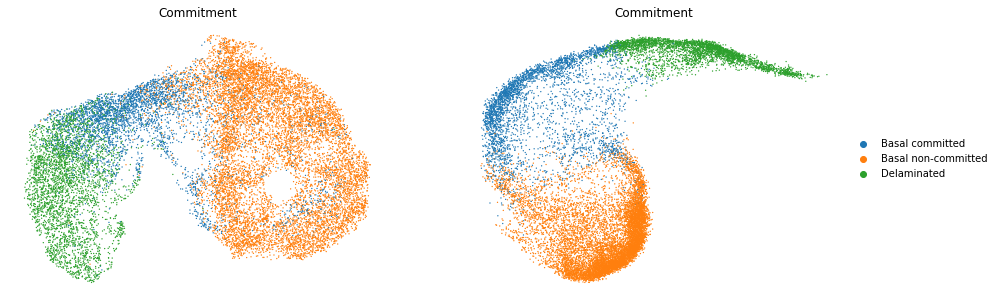

In [30]:
fig, axes = plt.subplots(ncols = 2, figsize = (15, 5))
sc.pl.embedding(adata, color = 'Commitment', basis = 'umap_orig', ax = axes[0], show = False, frameon = False, legend_loc = False)
sc.pl.embedding(adata, color = 'Commitment', basis = 'umap_ingest', ax = axes[1], show = False, frameon = False)

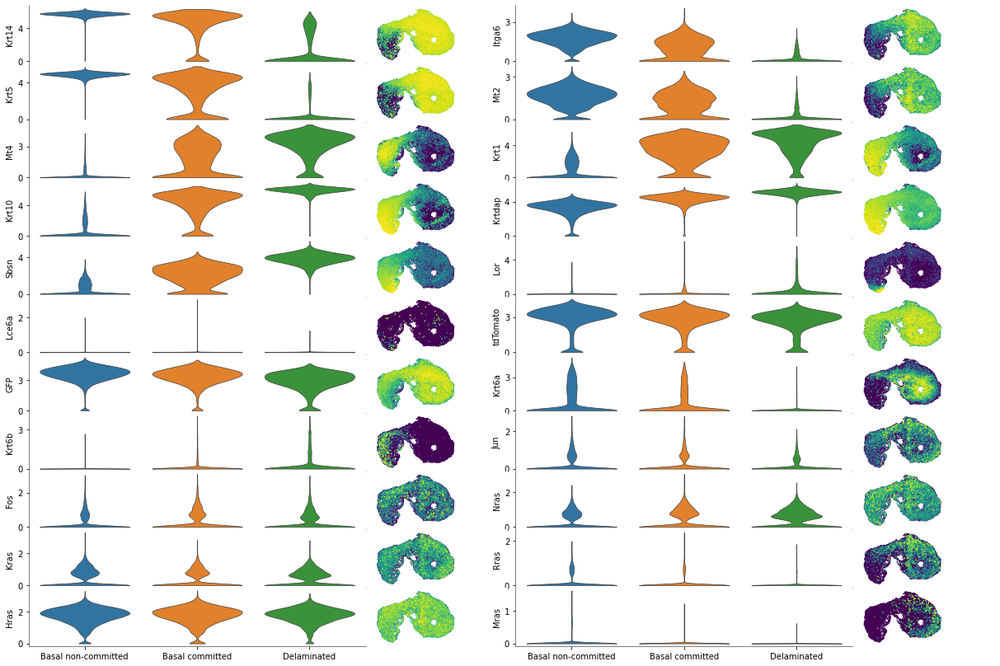

In [31]:
#Plot gene expression violinplots for commitment annotation
mpl.rcParams['axes.linewidth'] = 0.5
genes = ['Krt14', 'Itga6', 'Krt5', 'Mt2', 'Mt4', 'Krt1', 'Krt10', 'Krtdap', 'Sbsn', 'Lor', 'Lce6a', 'tdTomato', 'GFP', 'Krt6a','Krt6b','Jun','Fos', 'Nras','Kras','Rras','Hras','Mras']

percentile = 99.9

cols = 2
ncols = 3*cols
fig, axes = initialize_subplots(groups_to_plot=len(genes)*3, ncols = ncols, figsize_multiplier=(3.5,1.3), 
                                gridspec_kw= {'hspace':0, 'wspace': 0.05, 'width_ratios': [4,1, 0.5]*cols})

plot = 0
for ix, gene in enumerate(genes):
    ax = get_ax(axes, plot, ncols)
    
    expr = adata.raw[:, gene].X.toarray().flatten()
    vmax = np.percentile(expr, q = percentile)
    
    sc.pl.violin(adata, keys = gene, groupby = 'Commitment', cut = 0, rotation = 0, ax = ax, show = False, stripplot = False, linewidth = 0.7, 
                 palette = 'tab10', order = ['Basal non-committed', 'Basal committed', 'Delaminated'])
    
    ax.yaxis.set_major_locator(MaxNLocator(integer=True, nbins = 2))
    if ix < len(genes)-2:
        ax.tick_params(
        axis='x',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom=False,      # ticks along the bottom edge are off
        top=False,         # ticks along the top edge are off
        labelbottom=False)
        
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    
    plot+=1
    ax = get_ax(axes, plot, ncols)
    sc.pl.embedding(adata, basis = 'umap_orig', color = gene, ax = ax, show = False, frameon = False, title = '', s = 10, vmax = vmax)
    ax.set_ylim([ax.get_ylim()[0]-0.5, ax.get_ylim()[1]+0.5])
    # Remove umap colorbar
    ax.collections[-1].colorbar.remove()
    
    plot+=1
    ax = get_ax(axes, plot, ncols)
    [ax.spines[spine].set_visible(False) for spine in ax.spines]
    ax.set_yticks([])
    ax.set_xticks([])
    plot+=1
    clear_output()
    
mpl.rcParams['axes.linewidth'] = 1

# Classify tdTomato and GFP

## Tomato

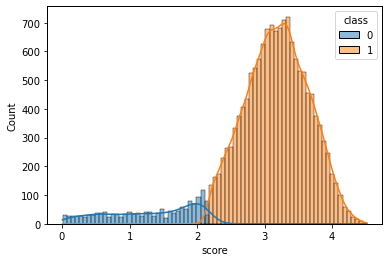

In [32]:
x = adata.raw[:, 'tdTomato'].X.toarray()
pos_cells = adata.obs_names[x.flatten()>0] #Don't include cells with 0-epxression in the gaussian mixture classification
x = adata.raw[pos_cells][:, 'tdTomato'].X.toarray()
components = 2
gmm = mixture.GaussianMixture(n_components=components, covariance_type='diag', n_init = 10).fit(x)
tmp = pd.DataFrame(x, columns = ['score'], index = pos_cells)
tmp['class'] = gmm.predict(x)
sort = {x: ix for ix, (x, s) in enumerate(tmp.groupby('class')['score'].mean().sort_values().items())}
tmp['class'] = [sort[x] for x in tmp['class']]

sbn.histplot(tmp, x = 'score', hue = 'class', palette = 'tab10', kde = True)

adata.obs['Tomato_class'] = ['Tom-' if x not in tmp.index #If cell had 0-expression then set as negative, else according to classification into dim and positive
                             else 'Tom dim' if tmp.loc[x, 'class']==0 else 'Tom+' for x in adata.obs_names]

## GFP

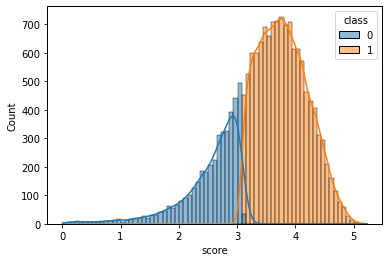

In [33]:
#Same approach as with Tomato
x = adata.raw[:, 'GFP'].X.toarray()
pos_cells = adata.obs_names[x.flatten()>0]
x = adata.raw[pos_cells][:, 'GFP'].X.toarray()
components = 2
gmm = mixture.GaussianMixture(n_components=components, covariance_type='diag', n_init = 10).fit(x)
tmp = pd.DataFrame(x, columns = ['score'], index = pos_cells)
tmp['class'] = gmm.predict(x)
sort = {x: ix for ix, (x, s) in enumerate(tmp.groupby('class')['score'].mean().sort_values().items())}
tmp['class'] = [sort[x] for x in tmp['class']]

sbn.histplot(tmp, x = 'score', hue = 'class', palette = 'tab10', kde = True)

adata.obs['GFP_class'] = ['GFP-' if x not in tmp.index else 'GFP dim' if tmp.loc[x, 'class']==0 else 'GFP+' for x in adata.obs_names]

... storing 'Tomato_class' as categorical
... storing 'GFP_class' as categorical


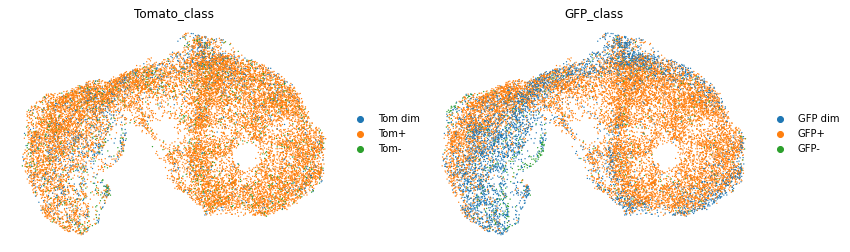

In [36]:
sc.pl.umap(adata, color = ['Tomato_class', 'GFP_class'], frameon = False)

# Save loom file

In [34]:
path = '{}/Users/karlan/Google Drive/MKA/Papers/Greco/Sara and Nur/Loom files/Processed'.format(root)

In [35]:
adata.write_loom(os.path.join(path, 'WTMU_filtered_integrated_annotated.loom'), write_obsm_varm=True)

# Plots

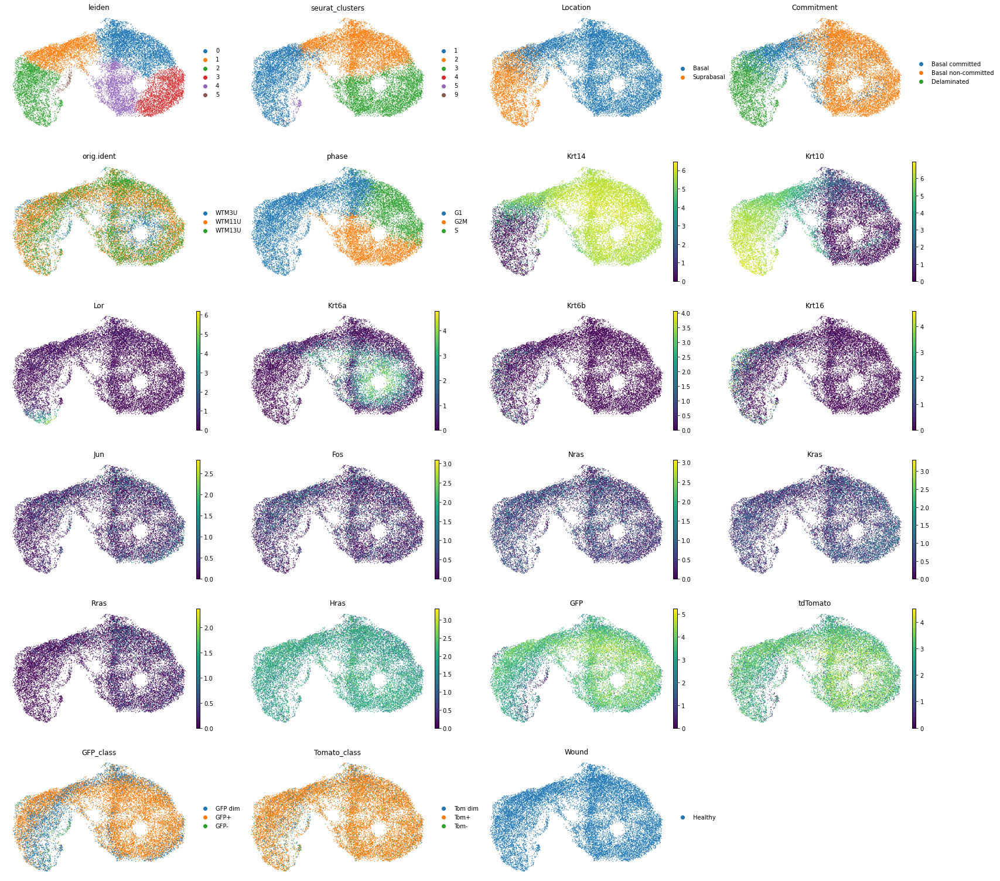

In [38]:
groups = ['leiden', 'seurat_clusters', 'Location', 'Commitment', 'orig.ident','phase',
          'Krt14','Krt10','Lor','Krt6a','Krt6b', 'Krt16','Jun', 'Fos','Nras','Kras','Rras','Hras', 'GFP','tdTomato',
          'GFP_class','Tomato_class', 'Wound']
sc.pl.umap(adata, color = groups, ncols = 4, frameon = False)